## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
plt.rcParams.update({'figure.max_open_warning': 0})
import operator

### Read Data

In [2]:
def read_data(file_name):
    file_path = file_name
    data = pd.read_csv(file_path,sep=',',names = ['time_counter','accel_base_X','accel_base_Y','accel_base_Z','gyro_base_X',
                                                  'gyro_base_Y','gyro_base_Z','accel_right_X','accel_right_Y','accel_right_Z',
                                                  'gyro_right_X','gyro_right_Y','gyro_right_Z','accel_left_X','accel_left_Y',
                                                  'accel_left_Z','gyro_left_X','gyro_left_Y','gyro_left_Z','fall_detection'])
    return data

In [3]:
def read_combined_csvdata(file_name, airbag_data):
    file_path = file_name
    data = pd.read_csv(file_path)
    data['Time Point Name'] = pd.to_numeric(data['Time Point Name'], errors='coerce')
    data = data[(data['Time Point Name']>100) & (data['Time Point Name'] < 200) &
                (data['Impact milisec'].notnull()) & ((data['Start milisec']) < (airbag_data.iloc[-1][0]))]
    data = data[['Time Point Name','Start milisec','Impact milisec', 'End Milisec','Duration']]
    return data

In [4]:
def add_new_fall_value(airbag_data, manual_data):
    # Create Column that is the magnitude of the acceleration vector from the data
    # Iterate through the combined data to find points at which time counter of the airbag_data is within the start and end milliseconds of the row
    # find the max of the 'accel_base_mag' within that time frame, set 'cal_impact_milisec' = 80
    airbag_data['accel_base_mag'] =  np.sqrt(airbag_data['accel_base_X']**2 + airbag_data['accel_base_Y']**2 +
                                             airbag_data['accel_base_Z']**2)
    for index, row in manual_data.iterrows():
        airbag_data.loc[(airbag_data['accel_base_mag'] == \
                                             (airbag_data.loc[(airbag_data['time_counter'] >= row['Start milisec']) & \
                                                                   (airbag_data['time_counter'] < row['End Milisec']),
                                                                   'accel_base_mag'].max())) & \
                                                 (airbag_data['time_counter'] >= row['Start milisec']) & \
                                                 (airbag_data['time_counter'] < row['End Milisec']),
                                                 'cal_impact_milisec'] = 80


In [5]:
def big_size_plot_of_acceleration_vs_time(data, name, x=15, y=10, left = -1, right = -1):
    fig, axs = plt.subplots(figsize=(x,y))
    fig.suptitle('Bace acceleration for AIRBAG-'+name)
    
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_X*(10**(-3)), marker='', color='red', linewidth=1, label='X')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_Y*(10**(-3)), marker='', color='blue', linewidth=1, label='Y')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_Z*(10**(-3)), marker='', color='green', linewidth=1, label='Z')
    axs.plot( data.time_counter*(10**(-3)),data.accel_base_mag*(10**(-3)), marker='', color='black', linewidth=1, label='Magnitude')
    axs.scatter(data.time_counter*(10**(-3)),data.cal_impact_milisec/4,s=30,c = 'violet')
    
    if (left>-1 and right>-1):
        axs.set_xlim(left,right)
    elif (left > -1):
        axs.set_xlim(left)
    elif (right > -1):
        axs.set_xlim(right)
    else:
        axs.set_xlim()
    
    axs.legend()
    axs.set_title('Data')

In [6]:
def plot_all_impact_graphs(airbag_data, manual_data):
    for index, row in manual_data.iterrows():
        big_size_plot_of_acceleration_vs_time(data=airbag_data,label='S2',left=row['Start milisec']*(10**(-3))/60,
                                              right= row['End Milisec']*(10**(-3))/60)

In [7]:
def plot_all_zoom_impact_graphs(airbag_data,manual_data,label,imp_bef = 250,imp_aft = 300):
    cnt = 1
    for each_impact in airbag_data.loc[airbag_data['cal_impact_milisec'] == 80,'time_counter'].values:
        print('plot no.',str(cnt),' at ',each_impact)
        cnt+=1
        big_size_plot_of_acceleration_vs_time(data=airbag_data,name= label,left=(each_impact - imp_bef)*(10**(-3)),
                                      right= (each_impact + imp_aft)*(10**(-3)))

In [25]:
def plot_falls_zoomed(subject, left, right, name, fn, width=10, height=8):
    fig, axs = plt.subplots(figsize=(width, height))
    falls = subject.loc[subject["cal_impact_milisec"] == 80]
    fall_times = falls['time_counter'].values.tolist()
    
    fig.suptitle("Subject " + name + " - Fall Number " + str(fn+1) + " - Occurs at " + str(fall_times[fn] * (10 ** (-3))) + " s")
    fc = 1
    # Get Indexes for time
    start_time = fall_times[fn] - left
    end_time = fall_times[fn] + right
    start_time = subject.loc[subject["time_counter"] == start_time].index[0]
    end_time = subject.loc[subject["time_counter"] == end_time].index[0]

    # Setup X and Y for plotting
    time = subject.loc[start_time:end_time, 'time_counter'] * (10**(-3))
    accel = subject.loc[start_time:end_time, 'accel_base_mag'] *(10**(-3))
    x = subject.loc[start_time:end_time, 'accel_base_X'] * (10**(-3))
    y = subject.loc[start_time:end_time, 'accel_base_Y'] * (10**(-3))
    z = subject.loc[start_time:end_time, 'accel_base_Z'] *(10**(-3))
#     fall = subject.loc[start_time:end_time, 'cal_impact_milisec'] *(10**(-3))
# 
    # Plot Graphs
    plt.xlabel("Time in (s)")
    plt.ylabel("XYZ, Magnitude")
    axs.plot(time, accel, marker='', color='black', linewidth=1, alpha = 0.8, label="Accel")
    axs.plot(time, x, marker='', color='blue', linewidth=1, alpha = 0.8, label="X")
    axs.plot(time, y, marker='', color='green', linewidth=1, alpha = 0.8, label="Y")
    axs.plot(time, z, marker='', color='red', linewidth=1, alpha = 0.8, label="Z")
    plt.axvline(x = fall_times[fn] * (10**(-3)),ls = '--' color="m", linewidth=1)
    plt.legend()
    return fig

In [22]:
# READ IN DATA
data_path = '../../Data/'

#S1
s1_data=read_data(data_path + 'S1-Airbag.csv')
s1_combined = read_combined_csvdata(data_path + 'S1-Combined.csv', s1_data)
add_new_fall_value(s1_data, s1_combined)

#S2
s2_data=read_data(data_path + 'S2-Airbag.csv')
s2_combined = read_combined_csvdata(data_path + 'S2-Combined.csv', s2_data)
add_new_fall_value(s2_data, s2_combined)

# #S3
s3_data=read_data(data_path + 'S3-Airbag.csv')
s3_combined = read_combined_csvdata(data_path + 'S3-Combined.csv', s3_data)
add_new_fall_value(s3_data, s3_combined)

# #C1
c1_data=read_data(data_path + 'C1-Airbag.csv')
c1_combined = read_combined_csvdata(data_path + 'C1-Combined.csv', c1_data)
# c1_data2 = pd.DataFrame.copy(c1_data, deep=True)
add_new_fall_value(c1_data, c1_combined)

# #C2
c2_data=read_data(data_path + 'C2-Airbag.csv')
c2_combined = read_combined_csvdata(data_path + 'C2-Combined.csv', c2_data)
add_new_fall_value(c2_data, c2_combined)

# #C3
c3_data=read_data(data_path + 'C3-Airbag.csv')
c3_combined = read_combined_csvdata(data_path + 'C3-Combined.csv', c3_data)
add_new_fall_value(c3_data, c3_combined)   


### Visualizing Data

In [23]:
s1_falls = len(s1_data.loc[s1_data["cal_impact_milisec"] == 80])
s2_falls = len(s2_data.loc[s2_data["cal_impact_milisec"] == 80])
s3_falls = len(s3_data.loc[s3_data["cal_impact_milisec"] == 80])
c1_falls = len(c1_data2.loc[c1_data["cal_impact_milisec"] == 80])
c2_falls = len(c2_data.loc[c2_data["cal_impact_milisec"] == 80])
c3_falls = len(c3_data.loc[c3_data["cal_impact_milisec"] == 80])

S1
S2
S3
C1
C2
C3


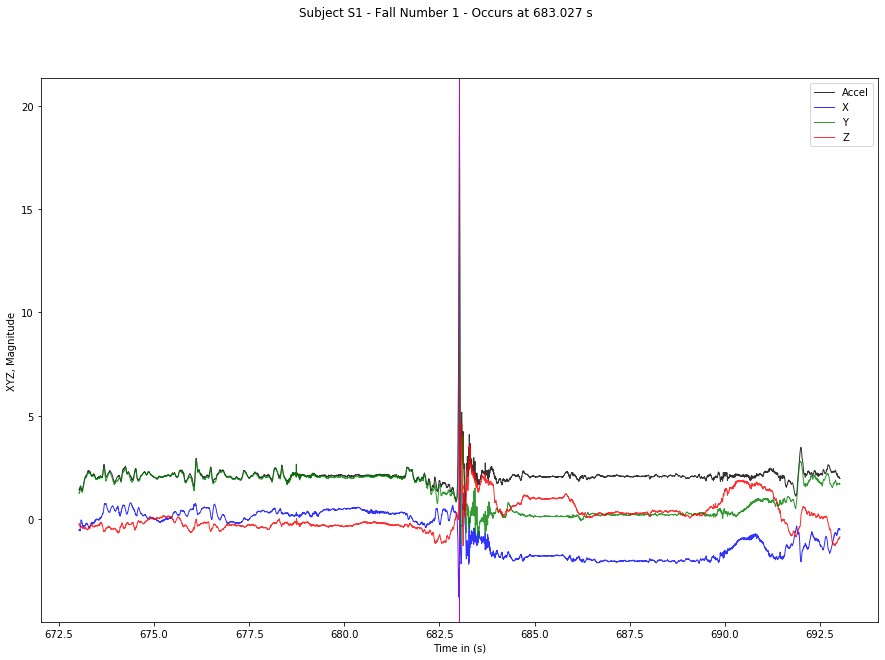

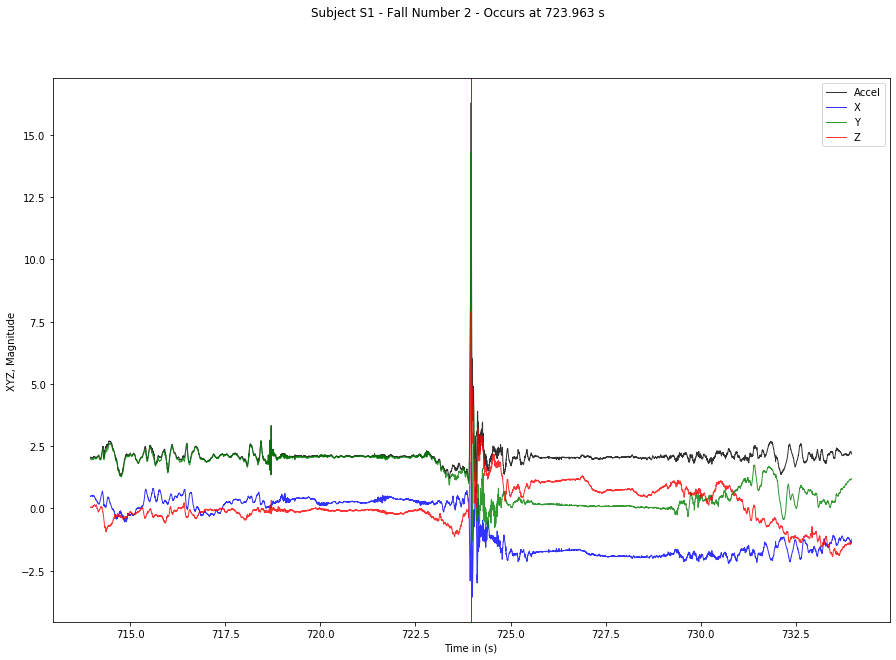

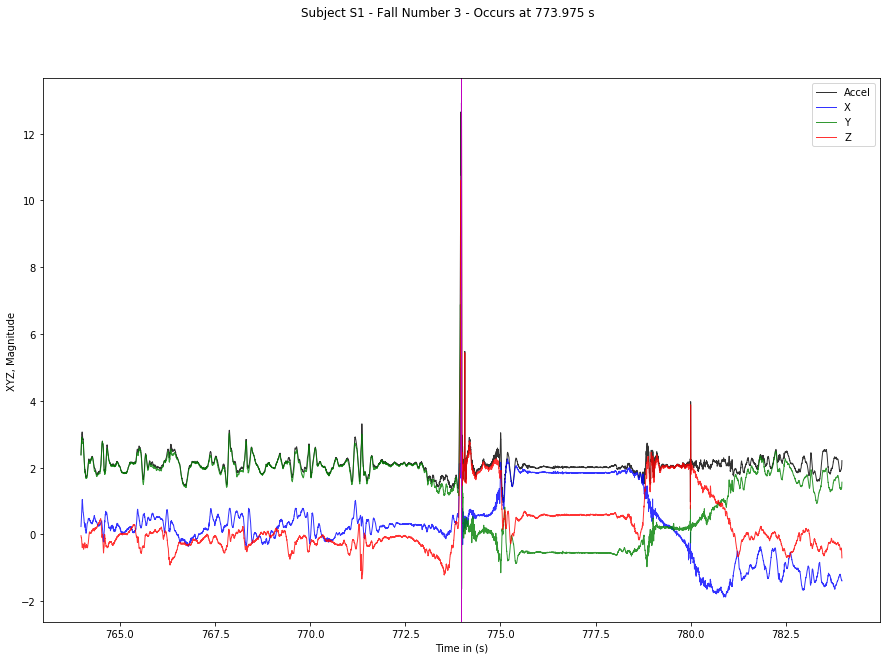

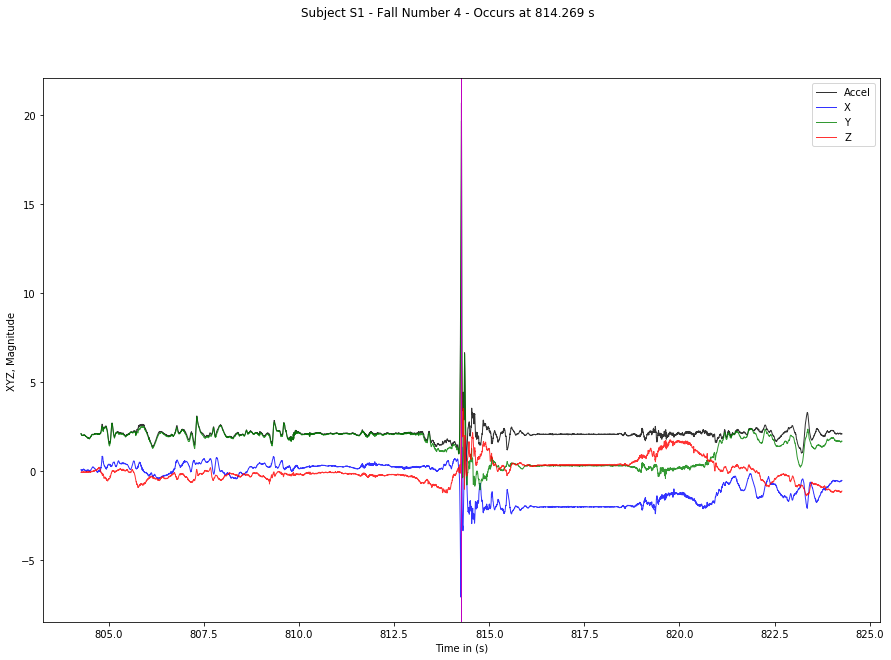

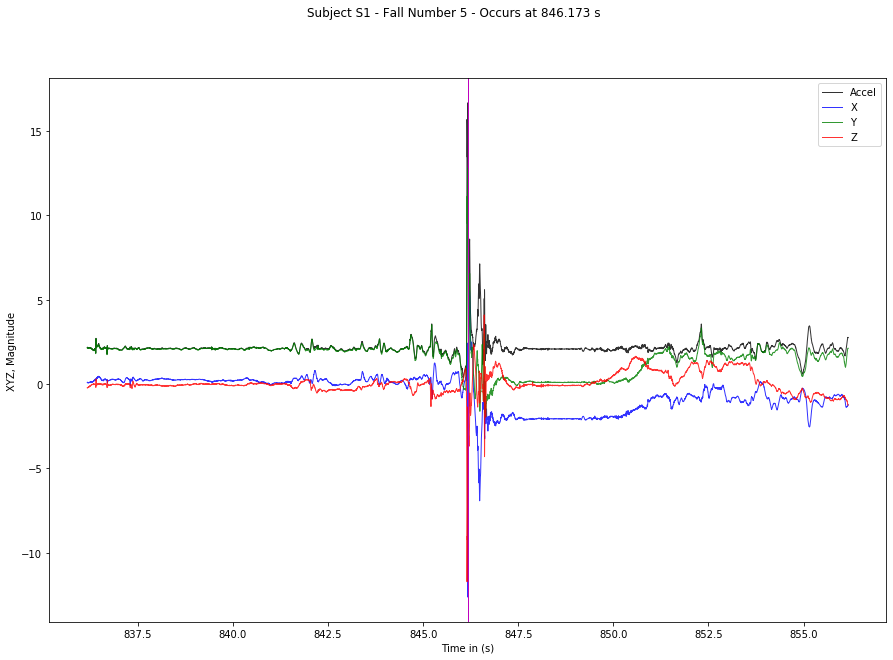

...

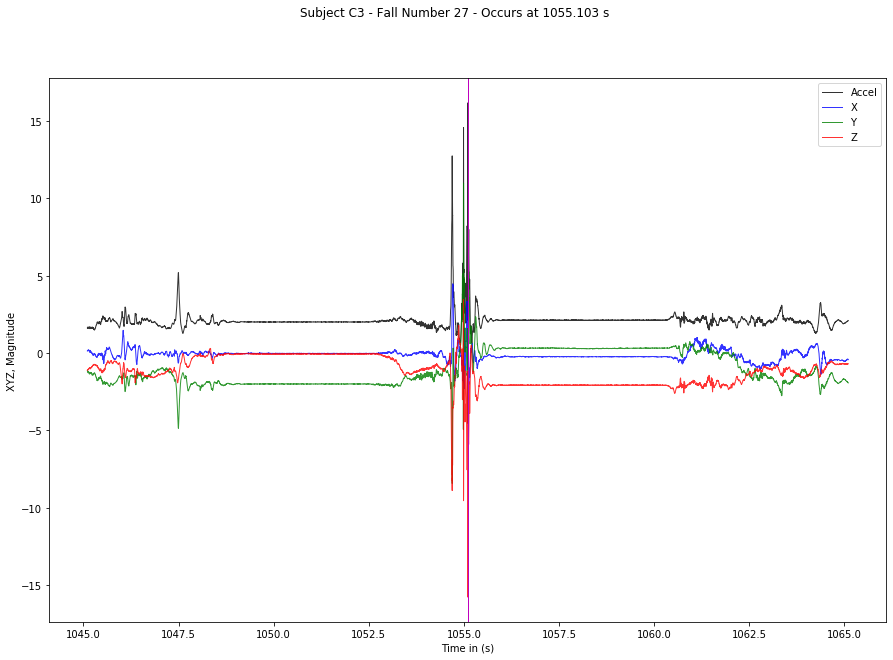

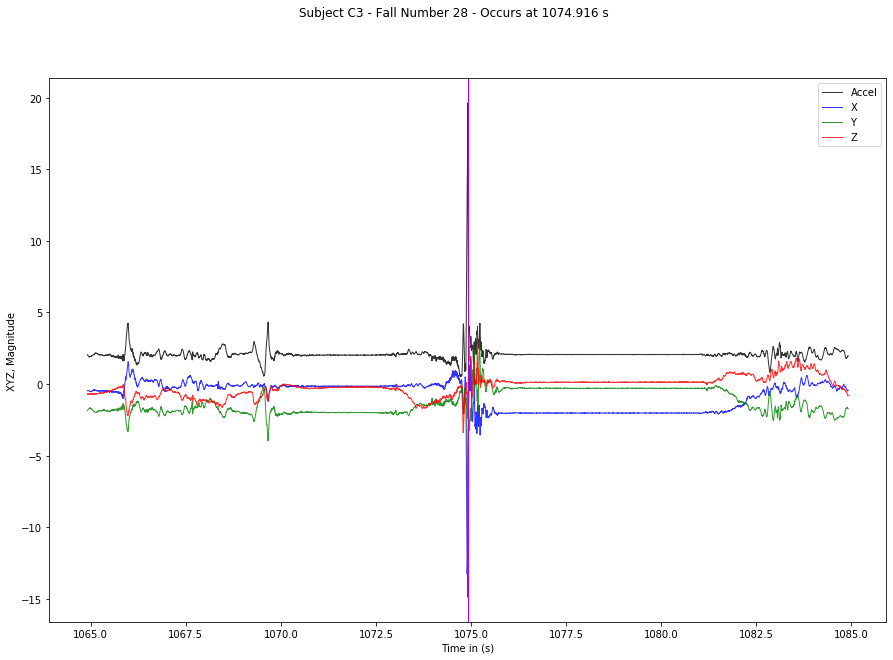

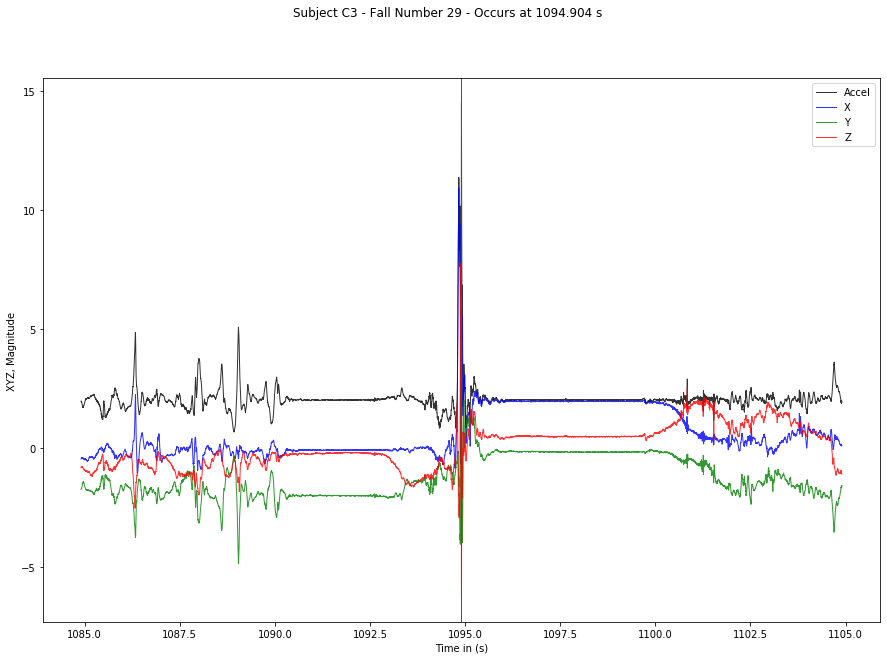

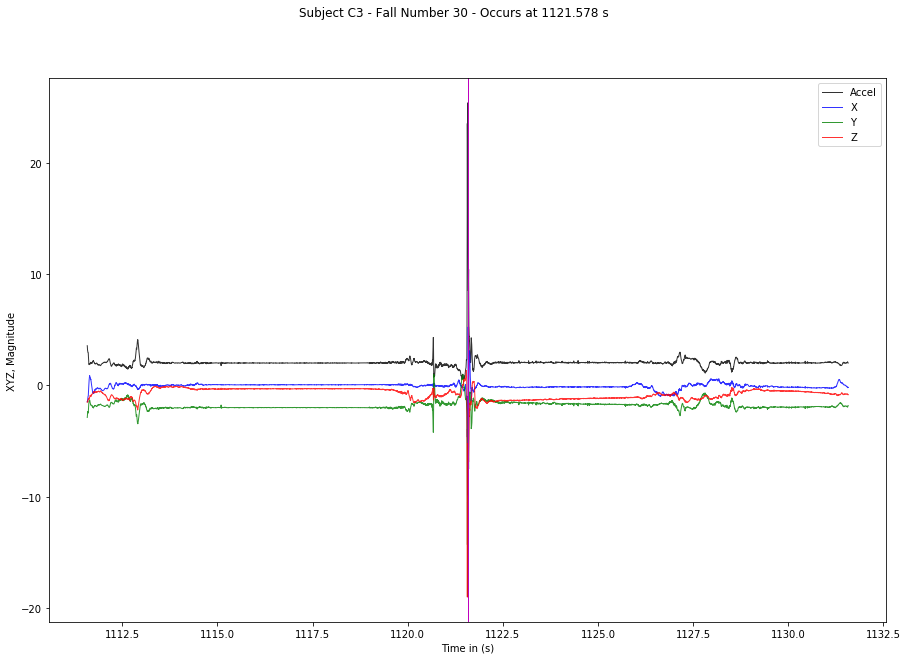

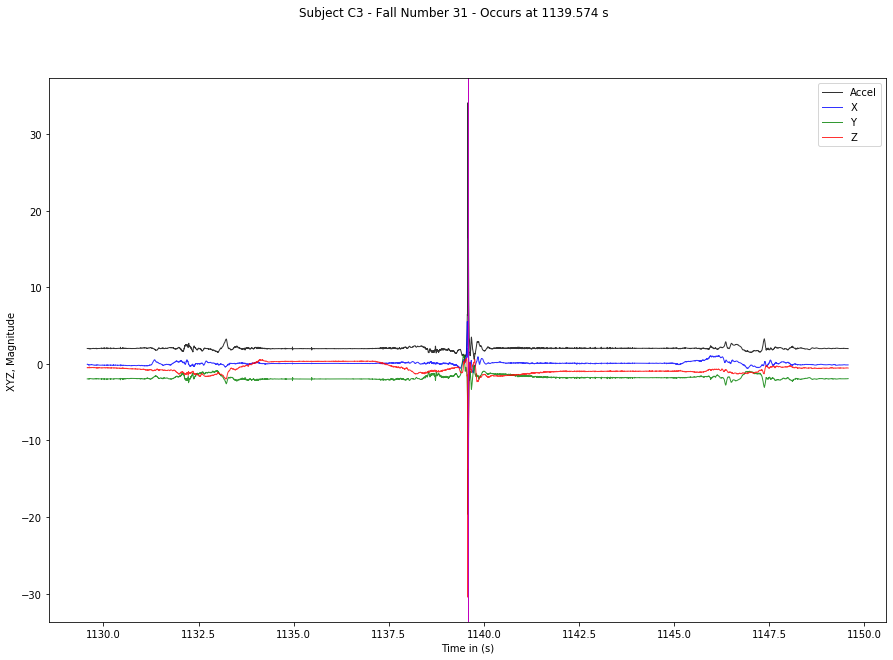

In [26]:
subjects = ['S1','S2','S3','C1','C2','C3']
subject_falls = [s1_falls,s2_falls,s3_falls,c1_falls,c2_falls,c3_falls]
subject_data = [s1_data,s2_data,s3_data,c1_data,c2_data,c3_data]
for i in range(len(subjects)):
    print(subjects[i])
    pp = PdfPages(subjects[i]+"_10sec_radius.pdf")
    for j in range(subject_falls[i]):
        f = plot_falls_zoomed(subject_data[i], 10000, 10000, subjects[i], j, width=15, height=10)
        pp.savefig(f)
    pp.close()
